CNN_GRU 의 Latent Space 크기를 줄여보는 테스트

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]=""

import tensorflow as tf
from src import vrae, train, utils
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

physical_devices = tf.config.experimental.list_physical_devices('GPU')
print(physical_devices)
for gpu in physical_devices:
    tf.config.experimental.set_memory_growth(gpu, True)

[]


# Data Load

In [2]:
def tensorset(arr, shape, batch_size, drop_remainder=True):
    # type casting & reshaping
    data = arr.astype(np.float32)
    print("Before reshape : {}".format(data.shape))
    data = np.reshape(data, shape)
    print("After reshape : {} | data type : {}".format(data.shape, data.dtype))
    # make to tensor
    ds = tf.data.Dataset.from_tensor_slices(data)
    ds = ds.batch(batch_size, drop_remainder=drop_remainder)
    return ds

In [3]:
batch_size = 128
train_set = np.load('/works/Data/wellysis/preprocessed/5s_mit_forVAEtrain.npy')
print("Total Data Set shape is : {}".format(train_set.shape))
time_size = train_set.shape[1]
print(train_set.min(), train_set.max(), train_set.mean(), train_set.std())
train_set = tensorset(arr = train_set, shape=(-1, time_size, 1), batch_size=batch_size)

Total Data Set shape is : (225408, 640, 1)
0.0 1.0 0.48390256368532036 0.07240195371434505
Before reshape : (225408, 640, 1)
After reshape : (225408, 640, 1) | data type : float32


# Model Load

In [4]:
from src import cnn_gru

model = cnn_gru.CNNGRU(T=640, hidden_size=512, latent_dims=16, dropout=0.0, recurrent_dropout=0.0)
model.summary()

Model: "DARNN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inputs (InputLayer)          [(None, 640, 1)]          0         
_________________________________________________________________
Encoder_Module (Functional)  (None, 512)               4122432   
_________________________________________________________________
dense (Dense)                (None, 16)                8208      
_________________________________________________________________
Decoder_Module (Functional)  (None, 640, 1)            5180097   
Total params: 9,310,737
Trainable params: 9,310,737
Non-trainable params: 0
_________________________________________________________________


In [5]:
model.load_weights("/works/GitLab/jomjam/Python/AnomalyDetection/ECG/save/20210831_20_50_53_5s_mitTotal_cnn_gru_512hidden_16latent_gauss_bat128_lr1e4/save")

# Reconstruction Check

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline

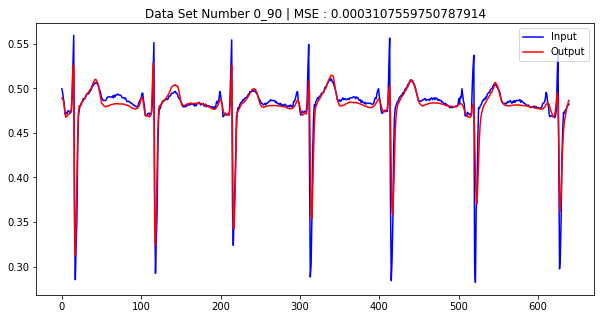

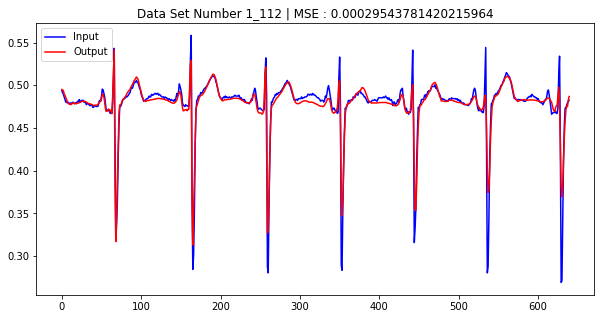

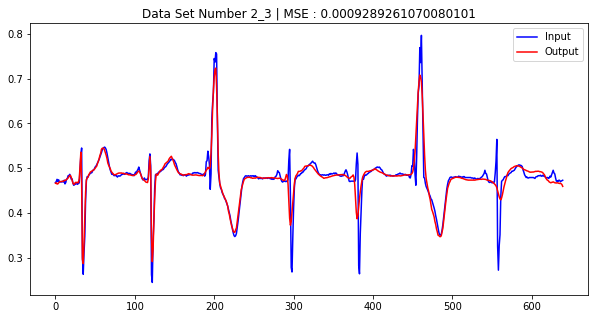

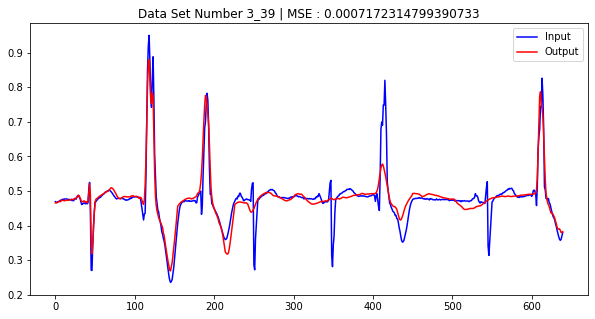

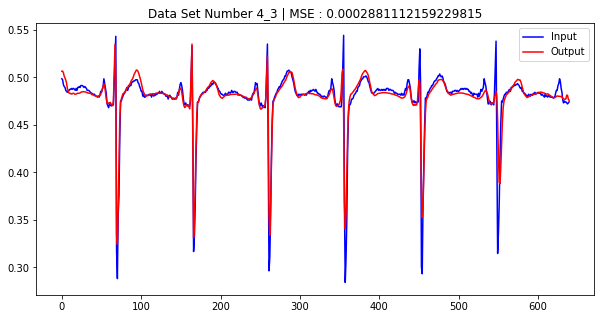

...

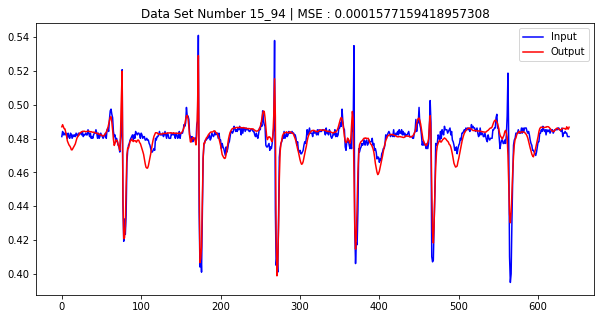

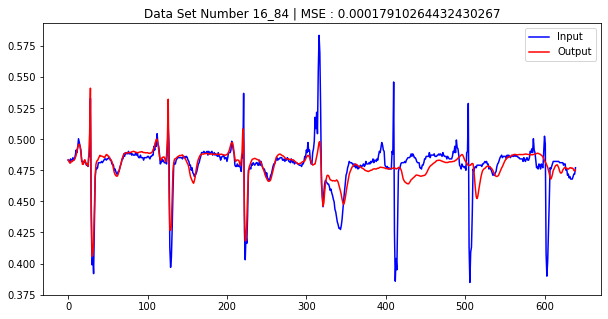

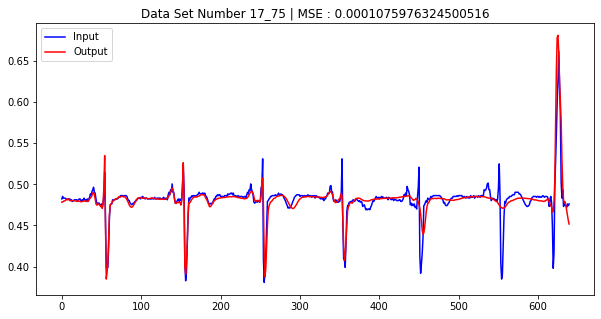

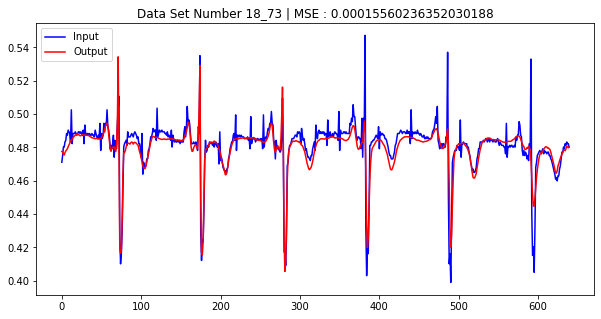

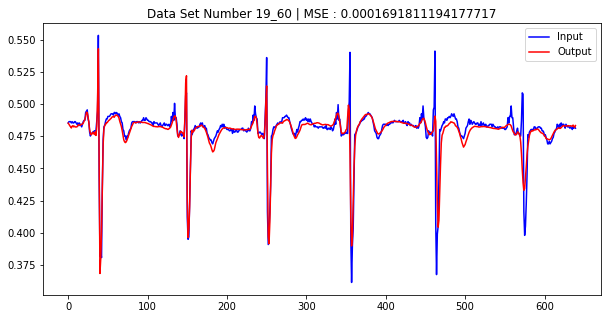

In [7]:
show_num = 20
show_idx = 0

for x in train_set:
    output, _ = model(x)
    x_arr = x.numpy().reshape(batch_size, time_size)
    y_arr = output.numpy().reshape(batch_size, time_size)
    mse = np.mean(np.square(x_arr-y_arr))
    random_idx = np.random.permutation(x_arr.shape[0])[0]
    
    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(111)
    ax.plot(np.arange(time_size), x_arr[random_idx], label="Input", color="b")
    ax.plot(np.arange(time_size), y_arr[random_idx], label="Output", color="r")
    ax.legend()
    ax.set_title("Data Set Number {}_{} | MSE : {}".format(show_idx, random_idx, mse))
    plt.show()
    
    show_idx += 1
    
    if show_idx == show_num:
        break

# Clustering

In [10]:
def make_latent_set(model, data_set):
    base_arr = np.zeros((1, 16), dtype=np.float32)
    for x in data_set:
        outputs, latent = model(x)
        latent_arr = latent.numpy()
        base_arr = np.concatenate((base_arr, latent_arr), axis=0)
    base_arr = base_arr[1:]
    print(base_arr.shape)
    return base_arr

In [11]:
total_data_latent_arr = make_latent_set(model, train_set)

(225408, 16)


Scale 조정을 위한 PCA 작업 후, 변환 값에 대해 Kmeans로 군집화 수행

In [12]:
from sklearn.decomposition import PCA

In [13]:
def return_pca(nums, arr):
    pca = PCA(n_components=nums)
    printcipalComponents_mu = pca.fit_transform(arr)
    return pca

pca_num = 10
pca = return_pca(pca_num, total_data_latent_arr)
ratio = pca.explained_variance_ratio_
print(ratio, ratio.sum())

[0.52424765 0.15375218 0.08959921 0.06187196 0.04541095 0.03200678
 0.02062119 0.0185846  0.01393946 0.01254469] 0.9725786787145521


In [14]:
total_data_latent_pca = pca.transform(total_data_latent_arr)
print(total_data_latent_pca.shape)

(225408, 10)


In [15]:
from sklearn.cluster import KMeans

In [18]:
kmeans = KMeans(n_clusters=10).fit(total_data_latent_pca)
print(np.unique(kmeans.labels_))
print(len(kmeans.labels_))
for_see = np.load('/works/Data/wellysis/preprocessed/5s_mit_forVAEtrain.npy')[:len(total_data_latent_pca)]
print(for_see.shape)

[0 1 2 3 4 5 6 7 8 9]
225408
(225408, 640, 1)


## 클러스터별 샘플 시각화

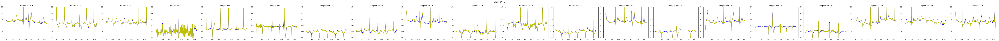

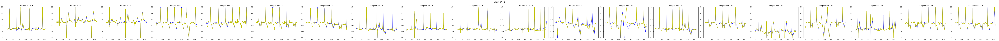

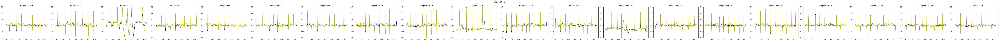

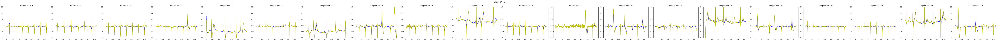

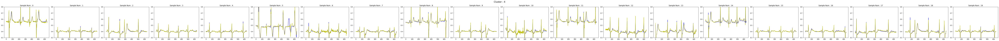

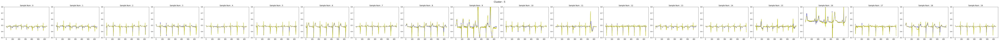

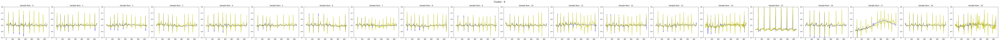

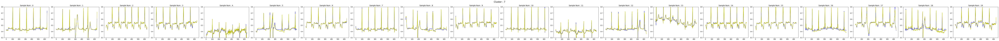

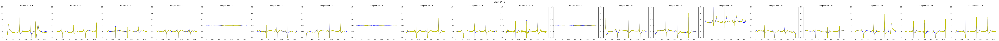

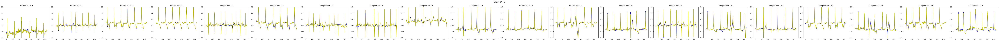

In [19]:
for i in range(len(np.unique(kmeans.labels_))):
    sample = for_see[kmeans.labels_ == i]
    sample = sample[np.random.permutation(len(sample))[:20]]
    sample = tf.convert_to_tensor(sample, dtype=tf.float32)
    outputs, latents = model(sample)
    outputs = outputs.numpy()
    sample = sample.numpy()
    fig = plt.figure(figsize=(len(outputs)*5,4), constrained_layout=True)
    axs = fig.subplots(1, len(outputs))
    for idx, ax in enumerate(axs):
        arr = outputs[idx].reshape(-1)
        real = sample[idx].reshape(-1)
        ax.plot(np.arange(len(arr)), arr, color="b")
        ax.plot(np.arange(len(real)), real, color="y")
        ax.set_title("Sample Num : {}".format(idx))
        ax.set(ylim=(0.3, 0.8))
    fig.suptitle('Cluster : {}'.format(i), fontsize=16)
    plt.show()

수정 필요

# Latent Space 조작

In [20]:
DL_input = tf.keras.Input(model.layers[3].input_shape[1:])
DL_model = DL_input
DL_model = model.layers[3](DL_model)
DL_model = tf.keras.Model(inputs=DL_input, outputs=DL_model)

DL_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 16)]              0         
_________________________________________________________________
Decoder_Module (Functional)  (None, 640, 1)            5180097   
Total params: 5,180,097
Trainable params: 5,180,097
Non-trainable params: 0
_________________________________________________________________


In [69]:
find_idx = 150000
now_idx = 0
for x in train_set:
    now_idx+=1
    if now_idx == find_idx:
        output, latent_arr = model(x)
        break

In [70]:
sample_latent_arr = latent_arr.numpy()[10]
sample_latent_arr = sample_latent_arr.reshape(1,16)

sample_latent_tensor = tf.convert_to_tensor(sample_latent_arr, dtype=tf.float32)

## 기준 샘플 추출

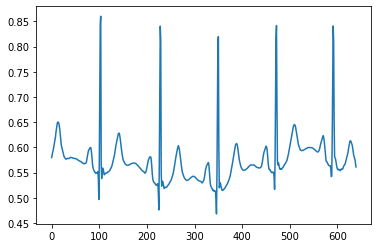

In [71]:
output_sampel = DL_model(sample_latent_tensor)
plt.plot(output_sampel.numpy().reshape(-1))

## Latent Vector에 값을 변경해가며 그래프 출력

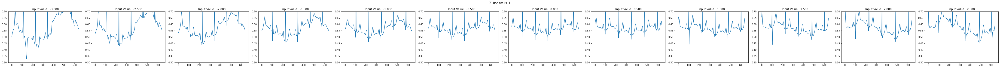

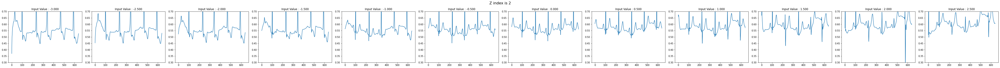

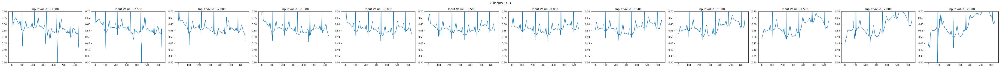

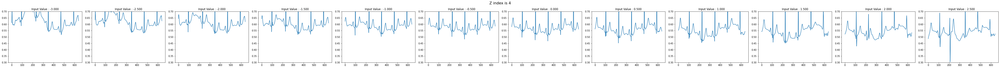

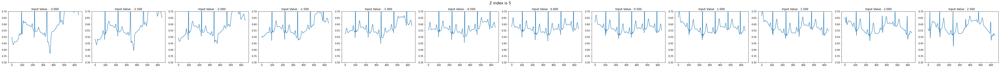

...

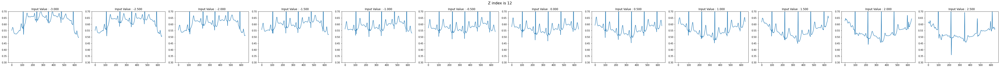

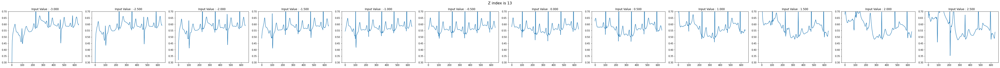

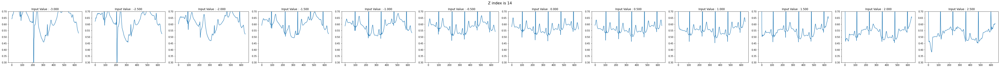

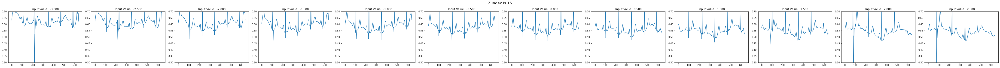

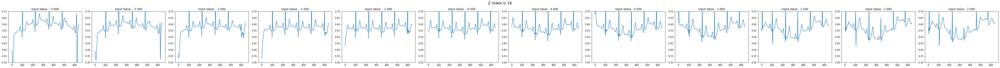

In [72]:
add_arr = np.arange(-3, 3, 0.5)

for z_idx in range(16):
    fig = plt.figure(figsize=(len(add_arr)*5,4), constrained_layout=True)
    axs = fig.subplots(1, len(add_arr))
    for idx, ax in enumerate(axs):
        for_input_mu = sample_latent_arr.copy()
        for_input_mu[:,z_idx] += add_arr[idx]
        outs = DL_model(for_input_mu).numpy().reshape(-1)
        ax.plot(np.arange(len(outs)), outs)
        ax.set_title("Input Value : {:.3f}".format(add_arr[idx]))
        ax.set(ylim=(0.3, 0.7))
    fig.suptitle('Z index is {}'.format(z_idx+1), fontsize=16)
    plt.show()

수정필요

# 한사람만을 대상으로 Clustering 수행 - Test 데이터 기준

In [73]:
sample_person_arr = np.load('/works/Data/wellysis/preprocessed/5s_mit_forVAEtest.npy')
sample_person_tesnor = tensorset(arr = sample_person_arr, shape=(-1, time_size, 1), batch_size=batch_size)
sample_person_latent_arr = make_latent_set(model, sample_person_tesnor)
sample_person_latent_pca_arr = pca.transform(sample_person_latent_arr)

Before reshape : (39988, 640, 1)
After reshape : (39988, 640, 1) | data type : float32
(39936, 16)


In [74]:
sample_person_kmeans = KMeans(n_clusters=5, random_state=0).fit(sample_person_latent_pca_arr)
print(np.unique(sample_person_kmeans.labels_))
print(len(sample_person_kmeans.labels_))
for_see = np.load('/works/Data/wellysis/preprocessed/5s_mit_forVAEtest.npy')[:len(sample_person_latent_pca_arr)]
print(for_see.shape)

[0 1 2 3 4]
39936
(39936, 640, 1)


# 한사람만을 대상으로 Clustering 수행 - Test 데이터 기준

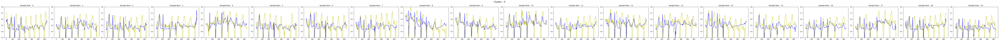

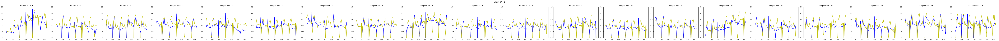

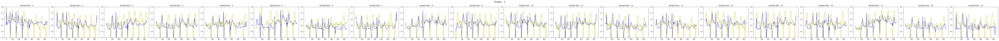

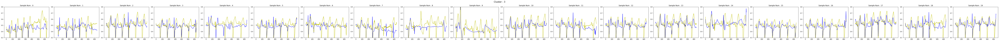

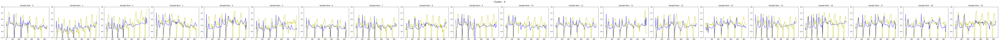

In [75]:
for i in range(len(np.unique(sample_person_kmeans.labels_))):
    sample = for_see[sample_person_kmeans.labels_ == i]
    sample = sample[np.random.permutation(len(sample))[:20]]
    sample = tf.convert_to_tensor(sample, dtype=tf.float32)
    outputs, latents = model(sample)
    outputs = outputs.numpy()
    sample = sample.numpy()
    fig = plt.figure(figsize=(len(outputs)*5,4), constrained_layout=True)
    axs = fig.subplots(1, len(outputs))
    for idx, ax in enumerate(axs):
        arr = outputs[idx].reshape(-1)
        real = sample[idx].reshape(-1)
        ax.plot(np.arange(len(arr)), arr, color="b")
        ax.plot(np.arange(len(real)), real, color="y")
        ax.set_title("Sample Num : {}".format(idx))
        ax.set(ylim=(0.3, 0.8))
    fig.suptitle('Cluster : {}'.format(i), fontsize=16)
    plt.show()

한데이터 안에서는 그렇게 큰 차이가 없어보이는데....  
Latent Vector 차원이 너무 큰가??..

# 한사람만을 대상으로 Clustering 수행 - Train 데이터 기준

In [76]:
sample_person2_arr = np.load('/works/Data/wellysis/preprocessed/5s_mit_num1.npy')
sample_person2_tesnor = tensorset(arr = sample_person2_arr, shape=(-1, time_size, 1), batch_size=batch_size)
sample_person2_latent_arr = make_latent_set(model, sample_person2_tesnor)
sample_person2_latent_pca_arr = pca.transform(sample_person2_latent_arr)

Before reshape : (28199, 640, 1)
After reshape : (28199, 640, 1) | data type : float32
(28160, 16)


In [77]:
sample_person2_kmeans = KMeans(n_clusters=5, random_state=0).fit(sample_person2_latent_pca_arr)
print(np.unique(sample_person2_kmeans.labels_))
print(len(sample_person2_kmeans.labels_))
for_see = np.load('/works/Data/wellysis/preprocessed/5s_mit_num1.npy')[:len(sample_person2_latent_pca_arr)]
print(for_see.shape)

[0 1 2 3 4]
28160
(28160, 640, 1)


## 클러스터 별 샘플 출력

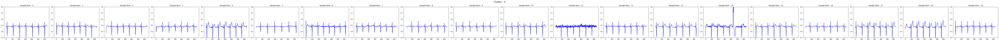

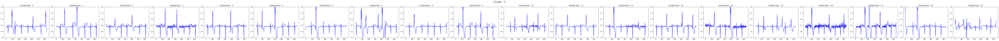

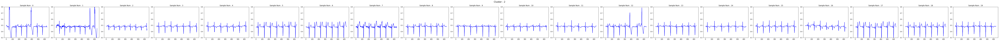

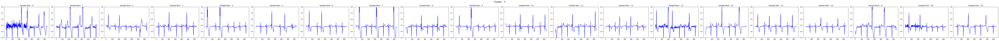

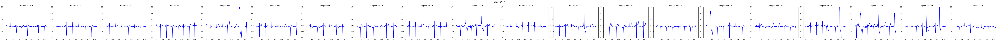

In [78]:
for i in range(len(np.unique(sample_person2_kmeans.labels_))):
    sample = for_see[sample_person2_kmeans.labels_ == i]
    sample = sample[np.random.permutation(len(sample))[:20]]
    sample = tf.convert_to_tensor(sample, dtype=tf.float32)
    outputs, latents = model(sample)
    outputs = outputs.numpy()
    sample = sample.numpy()
    fig = plt.figure(figsize=(len(outputs)*5,4), constrained_layout=True)
    axs = fig.subplots(1, len(outputs))
    for idx, ax in enumerate(axs):
        arr = outputs[idx].reshape(-1)
        real = sample[idx].reshape(-1)
        #ax.plot(np.arange(len(arr)), arr, color="b")
        ax.plot(np.arange(len(real)), real, color="b")
        ax.set_title("Sample Num : {}".format(idx))
        ax.set(ylim=(0.3, 0.8))
    fig.suptitle('Cluster : {}'.format(i), fontsize=16)
    plt.show()

클러스터별로 주기가 빨라진다던가 신호가 쌔진다거나 이상신호가 포착이 된다거나 그런 큰 특징은 안보인다...  
다만 마지막 클러스터에서 잔떨림? 이상치와 함께 측정된 데이터가 보이기는 한다.

## 두개의 클러스터로만 출력했을 경우

[0 1]
28160
(28160, 640, 1)


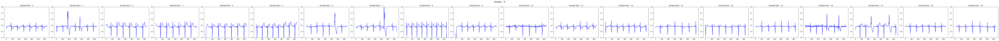

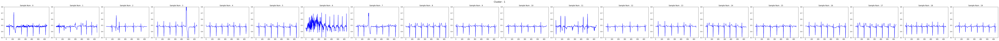

In [79]:
sample_person2_kmeans = KMeans(n_clusters=2, random_state=0).fit(sample_person2_latent_pca_arr)
print(np.unique(sample_person2_kmeans.labels_))
print(len(sample_person2_kmeans.labels_))
for_see = np.load('/works/Data/wellysis/preprocessed/5s_mit_num1.npy')[:len(sample_person2_latent_pca_arr)]
print(for_see.shape)
for i in range(len(np.unique(sample_person2_kmeans.labels_))):
    sample = for_see[sample_person2_kmeans.labels_ == i]
    sample = sample[np.random.permutation(len(sample))[:20]]
    sample = tf.convert_to_tensor(sample, dtype=tf.float32)
    outputs, latents = model(sample)
    outputs = outputs.numpy()
    sample = sample.numpy()
    fig = plt.figure(figsize=(len(outputs)*5,4), constrained_layout=True)
    axs = fig.subplots(1, len(outputs))
    for idx, ax in enumerate(axs):
        arr = outputs[idx].reshape(-1)
        real = sample[idx].reshape(-1)
        #ax.plot(np.arange(len(arr)), arr, color="b")
        ax.plot(np.arange(len(real)), real, color="b")
        ax.set_title("Sample Num : {}".format(idx))
        ax.set(ylim=(0.3, 0.8))
    fig.suptitle('Cluster : {}'.format(i), fontsize=16)
    plt.show()

# 분포

In [15]:
pca_2 = PCA(n_components=2)
pca_2_latent = pca_2.fit_transform(train_latent_arr)

In [16]:
pca_2_latent.shape

(29984, 2)

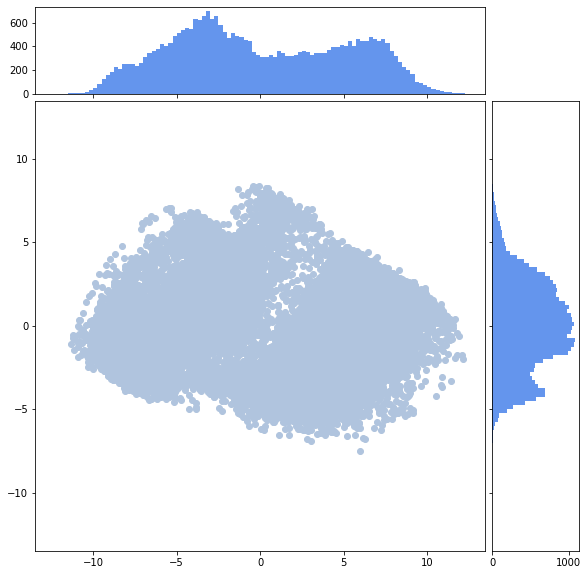

In [17]:
x = pca_2_latent[:,0]
y = pca_2_latent[:,1]

from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(x, y, color="lightsteelblue")

# Set aspect of the main axes.
ax.set_aspect(1.)

# create new axes on the right and on the top of the current axes
divider = make_axes_locatable(ax)
# below height and pad are in inches
ax_histx = divider.append_axes("top", 1.2, pad=0.1, sharex=ax)
ax_histy = divider.append_axes("right", 1.2, pad=0.1, sharey=ax)

# make some labels invisible
ax_histx.xaxis.set_tick_params(labelbottom=False)
ax_histy.yaxis.set_tick_params(labelleft=False)

# now determine nice limits by hand:
binwidth = 0.25
xymax = max(np.max(np.abs(x)), np.max(np.abs(y)))
lim = (int(xymax/binwidth) + 1)*binwidth

bins = np.arange(-lim, lim + binwidth, binwidth)
ax_histx.hist(x, bins=bins, color="cornflowerblue")
ax_histy.hist(y, bins=bins, orientation='horizontal', color="cornflowerblue")

# the xaxis of ax_histx and yaxis of ax_histy are shared with ax,
# thus there is no need to manually adjust the xlim and ylim of these
# axis.

#ax_histx.set_yticks([0, 50, 100])
#ax_histy.set_xticks([0, 50, 100])

plt.show()

# Model Split

In [9]:
DL_input = tf.keras.Input(model.layers[3].input_shape[1:])
DL_model = DL_input
DL_model = model.layers[3](DL_model)
DL_model = tf.keras.Model(inputs=DL_input, outputs=DL_model)
DL_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32)]              0         
_________________________________________________________________
Decoder_Module (Functional)  (None, 640, 1)            5188289   
Total params: 5,188,289
Trainable params: 5,188,289
Non-trainable params: 0
_________________________________________________________________


In [19]:
DL_model.save("/works/GitLab/jomjam/Python/AnomalyDetection/ECG/StreamLit/cnn_gru")

INFO:tensorflow:Assets written to: /works/GitLab/jomjam/Python/AnomalyDetection/ECG/model_file/cnn_gru/assets


INFO:tensorflow:Assets written to: /works/GitLab/jomjam/Python/AnomalyDetection/ECG/model_file/cnn_gru/assets


[-0.19842026  1.7657682   1.4513264  -0.88683397 -1.2984148   0.3855371
  0.6479128   0.6992226   1.1999288   1.3251653  -2.4316766   0.91887474
 -0.21862859 -0.32305953 -3.5355313   0.0335215  -0.11522541  1.4006951
  0.98456615 -0.67853117 -0.72081006  1.723255    1.4941049   0.5182365
  0.9491732   1.9897977  -0.7647663  -0.66923726  2.010035    2.1032498
  0.23231463 -1.6371317 ]


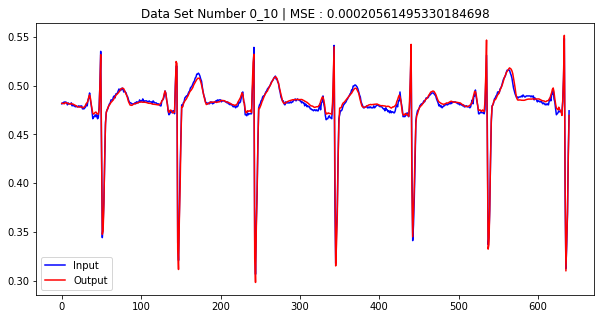

[-2.761063   -0.6886317  -0.08718795  0.06263173 -0.5858131  -1.501733
  2.8392005   1.9069833  -0.55854553  4.30114    -5.0857053  -1.8302189
 -0.153943    1.7357715  -2.5260015   0.01349547 -1.7719486  -6.90315
  1.191311   -2.3157477   0.5102451  -0.02488312  5.019502   -0.37275785
 -0.03379458  0.6944066  -0.15189436  1.8808593   3.7213323  -3.448697
 -1.0496482  -3.5234032 ]


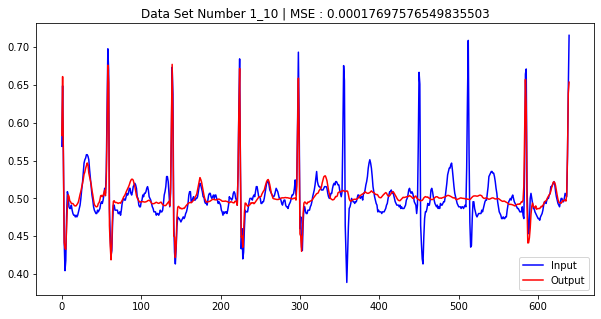

[-1.761432   -0.49590978  0.9045609  -0.2695377  -1.1627657   1.1235006
 -0.6965471   1.1558157  -0.8958747   4.0089803  -3.996682    1.5588914
  0.58506024  2.7658362  -4.5174217   0.8055626   0.2182142  -2.2548702
 -0.39240262 -1.8757399   0.47503966  1.5264857   6.49546    -0.5019432
 -1.592519    2.1760383   1.0744355   0.44732404  3.297781   -0.52215713
 -0.29180273 -5.84452   ]


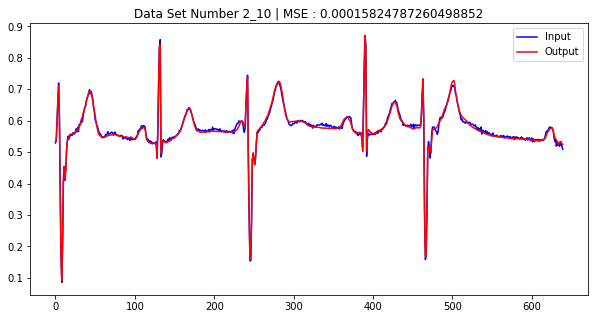

[-1.3748378   0.01326493  0.342634   -0.136276   -0.33604735  1.2512574
  0.98265177  1.2867208  -2.1215692   4.8045464  -4.0137177  -1.2877084
 -0.16625497  2.7985544  -2.4281082  -0.6551184  -0.5998723  -5.753073
 -0.31727102 -3.0528915   1.1786225   1.5339414   5.487748   -0.66426057
 -0.43069676  0.9456783   2.0961828   0.9549558   4.7204776  -1.9232881
  0.49734285 -5.748922  ]


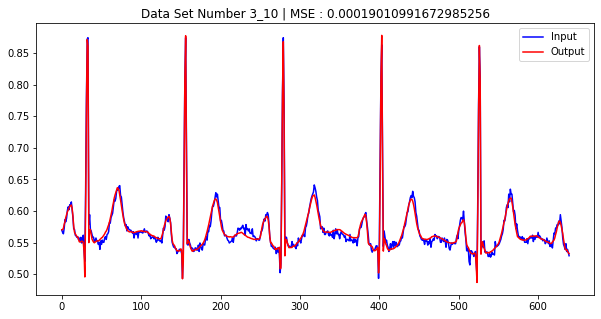

[-1.4018016   0.3727057   1.3301462   1.9465417  -1.6612124  -2.8676257
 -0.0931122   1.2176936  -2.9022765   2.339526   -2.0763867   1.3260622
 -1.0236665   4.6028614  -3.0735865   0.62611854 -2.25428    -1.8070705
 -1.6045681  -3.4720335  -0.26026952  0.7111812   3.067492   -1.7656689
 -0.8510461   0.13307403 -0.10621986  2.9839249   7.2241545  -0.56208956
 -0.20335056 -3.4768229 ]


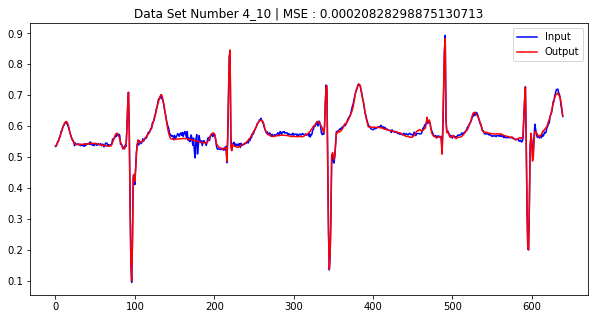

[-0.259235   -0.3027836   2.0258327  -0.196753   -2.0675244  -0.53140455
  1.1732626   0.7261588   0.8928818   3.3261442  -3.6255803  -0.17722528
 -0.39090288  2.720534   -1.3304172  -0.3994975  -0.4355181  -1.6898379
  0.84673965 -1.6333412   0.22129527  0.347434    2.7852206  -1.1772385
 -0.9994736   1.8516206  -1.6350853   1.1568674   2.6623185  -1.3706833
  0.29992118 -3.7713618 ]


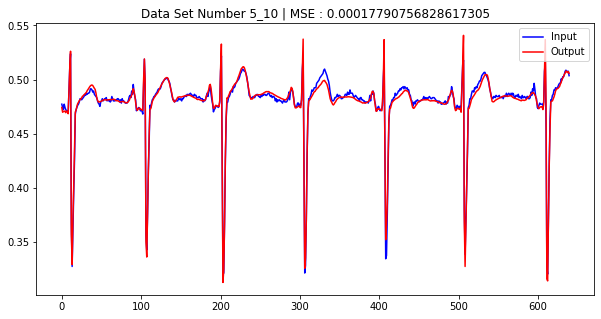

[-0.42746744 -0.31170914  2.469243    0.31433627 -2.4128044  -1.7125418
  0.10603455  0.9604928   1.958275    3.0598063  -2.9770093   0.34240806
  1.468763    2.3961673  -1.4533345   1.0472151  -0.24619699 -1.7076467
  0.3906404  -0.5960398   0.10198325  1.8744382   2.8475516  -1.5379283
 -1.1289961   2.657442   -3.2059703   0.81337625  2.137665   -2.176257
  0.21797986 -3.529615  ]


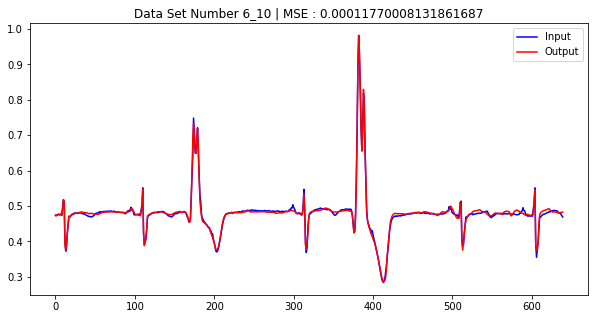

[ 0.25590286 -0.87219715  2.4080894   0.40813792 -1.3383071  -0.3801214
 -0.27210435 -0.1604367   1.8202091   2.2622736  -4.5287423   0.46126434
 -0.1923539   2.3875299  -1.9760661   0.51236427 -0.0619015  -2.0038855
  0.26049048 -1.2342242   0.57808644 -0.13102975  3.9340482  -1.3552469
 -0.27161473  1.2948265  -1.6608872   0.7389605   3.1313698  -1.9083958
  0.5030869  -3.926609  ]


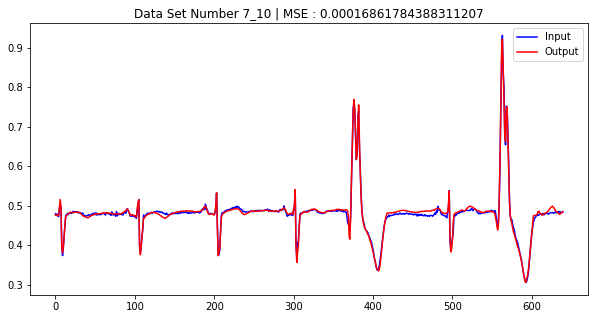

[-1.551209   -0.53829837  1.0458167  -1.0463883  -1.3968308   0.2600734
  2.233459    2.276694   -1.0330061   4.566925   -4.656709   -0.6566987
 -0.3425612   2.3304682  -2.8907661  -0.28575423 -0.8635798  -4.5630765
  1.0006384  -2.973828    0.6000842   1.0032575   4.914823   -0.42754012
 -0.11914227  0.5390882  -0.5690904   1.4263954   3.6866891  -2.3947356
 -0.1436472  -2.8199854 ]


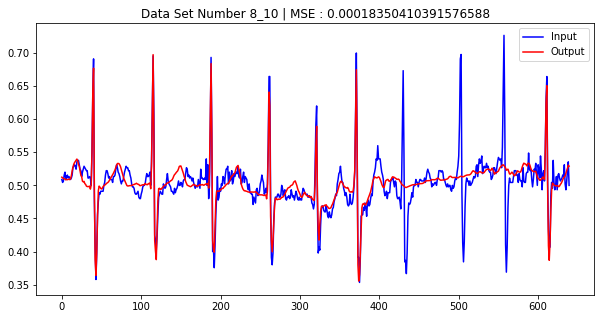

[-2.0434759  -1.251213   -0.6983499  -0.010678   -1.0729215  -0.821727
  3.6875448   1.02182    -0.9829821   4.8253     -4.307757   -0.40358335
 -0.52996594  0.03523226 -3.3647447   0.13212606 -2.177306   -6.0254254
  1.910632   -2.2425678  -0.48150653  0.05382055  4.338531    0.8476121
  0.66431046  1.1088744   0.59316236  0.93393445  3.668854   -3.737389
 -0.30877736 -4.091853  ]


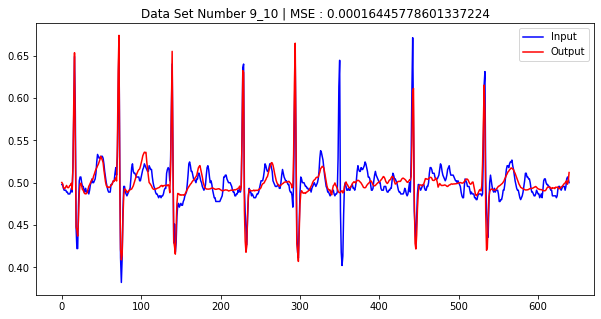

[-1.3194413  -0.08990744 -0.31057298  0.77543205 -0.18305029 -0.06368902
  2.4520416   0.42929173 -0.65081465  5.9534903  -2.2763672  -2.8429685
 -0.5776929   3.153502   -2.199465    0.9382596  -3.5239198  -6.259119
 -1.2642654  -1.1994522   1.0462435   0.5362736   5.194612   -0.2395807
 -2.1382592   0.7442552   2.1726031   2.1122882   5.6737995  -3.0381405
  1.4627548  -6.421057  ]


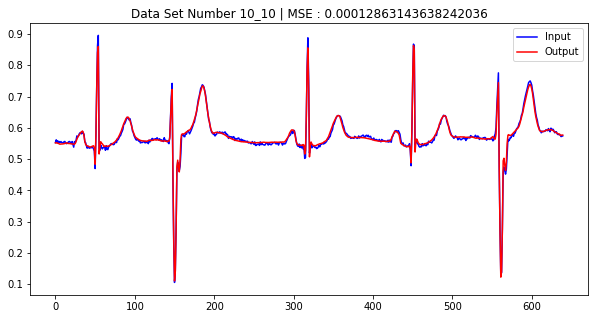

[ 0.31211463 -0.7608719   2.3477902  -0.04642326 -2.8796883   0.4724957
  0.8671177   0.75941414  1.2298259   2.9572172  -2.6847906  -0.03518406
 -0.1579077   1.6744424  -0.930365   -0.7192918   0.69260937 -1.5119897
  0.36637825 -0.6861958  -0.0096062   0.35213336  2.865789   -0.60613364
 -0.33692545  1.1828507  -2.5925548   0.25395608  1.6123118  -1.7437408
  0.5409778  -3.992155  ]


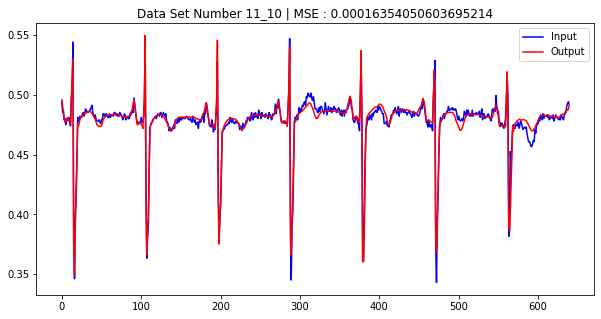

[-0.39813837  1.6239619   1.3660172  -1.0314883  -1.3789403   0.4469969
  0.88203895  0.72719884  1.1375312   1.213936   -2.1785448   1.0950271
 -0.24758616 -0.5456595  -3.7822285  -0.10343137 -0.08349067  1.4983859
  0.7396985  -0.55188805 -0.9498873   1.6524673   1.4060512   0.7871272
  0.9588919   1.8124088  -0.8592947  -0.6332051   1.8481271   2.189384
  0.23188765 -1.4721589 ]


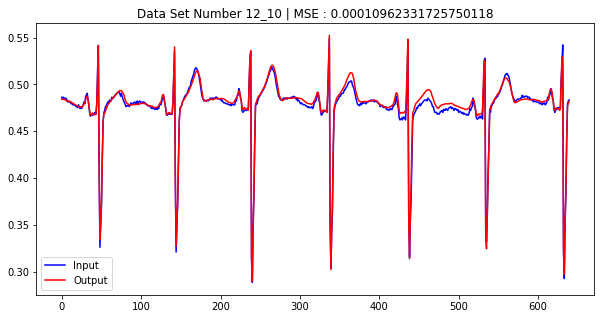

[ 0.09829238  0.655427    1.6850743  -0.09770183 -2.038744   -0.17197926
  0.74863935  1.286087    0.31453827  1.6869376  -2.6095002   0.80442995
 -0.5332744   1.741705   -2.6056828  -0.0683032   0.46174785  0.49991468
  0.68634814 -1.399852   -0.36286733  0.68017894  2.209855   -0.57214797
  0.97141933  1.0359136  -1.8534173   0.50182104  2.2910426   0.9311236
 -0.4147869  -1.8872969 ]


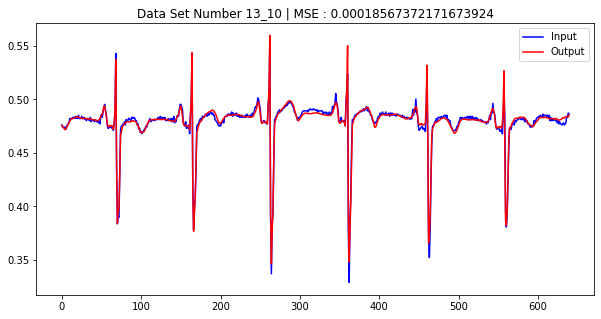

[-1.8252821  -0.9545369   0.14446765  1.1933545  -2.638712   -1.1613866
  1.02065     1.184821   -3.7399392   4.3169155  -2.283359    2.0871732
  0.12504253  3.3264246  -3.6990075  -0.5041242  -0.42235953 -4.1157207
 -0.26322204 -4.0840826   0.9757645   1.4827472   4.444355   -1.867989
 -0.11387166  0.2129992   1.3079594   1.1462375   4.629887   -1.3446335
 -0.74652785 -3.8349762 ]


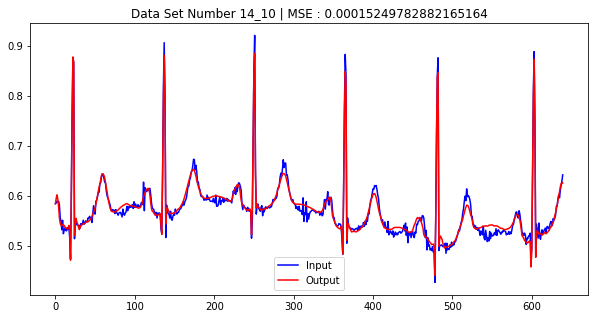

[ 0.9855933   1.3824517   2.4977126  -0.7407561  -2.4677308   1.567456
  0.12684268  0.47644186  0.8077124   2.3735275  -2.7765288  -0.02117477
 -0.1018415   0.16347367 -1.7384478  -0.45480436  0.93739307 -0.19841461
  0.8530448  -1.1234689  -0.05741023  1.4332103   2.907727    0.09956931
  0.52437377  1.3379297  -2.2014651  -0.8447012   1.9228518   0.23372896
  1.3921987  -3.5129914 ]


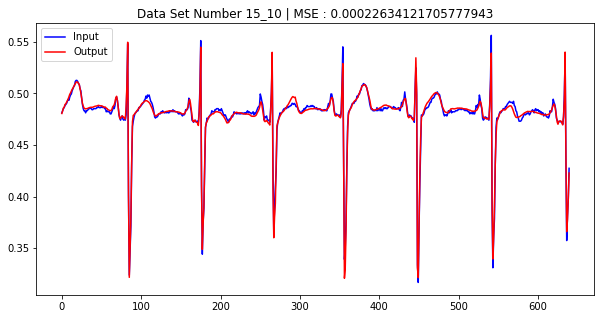

[-2.1513696   0.7051977   1.1390469  -1.2266003  -0.42546687  0.41309145
  1.0407536   3.0221026  -0.9114724   4.43775    -4.6501927   0.1552264
  0.15368009  1.3609239  -3.9554813   0.54651296 -0.9014445  -3.0585623
  2.5324695  -3.1633255   0.17398633  2.0227458   4.307168   -0.05578117
  0.8505655   1.3960731  -0.21124384  1.2519871   3.8543956  -0.96317965
 -0.59866595 -2.2187476 ]


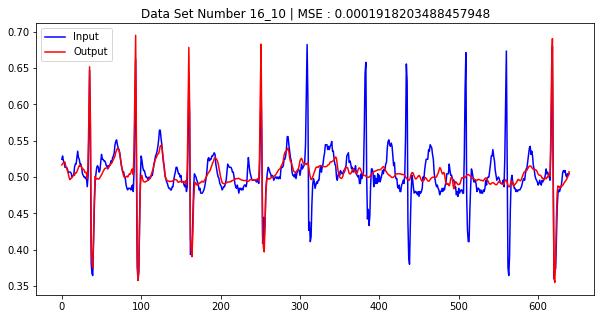

[ 1.0995225   0.5086492   2.4863067   0.05901995 -2.924503    0.81583154
 -0.6142743   1.2502786   0.71749187  2.1461196  -1.3394756   0.13004299
 -0.2964948   0.02396259 -0.6498217  -0.73680955  1.1442006   0.25508165
  0.5063646  -1.0575424  -0.42398372  1.1155605   2.0414782  -1.1674803
  0.72210574  0.7446953  -3.814261   -0.8909487   0.65530854 -0.16076909
  0.4694425  -3.1166096 ]


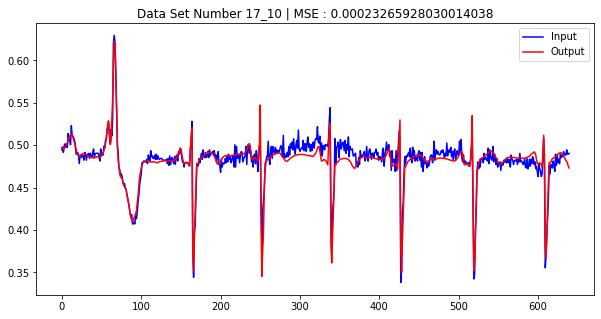

[-2.48734784e+00 -1.86683774e+00 -1.38768780e+00  7.73539603e-01
 -1.01013385e-01 -1.67985106e+00  2.24185538e+00  2.91272044e-01
 -1.51213241e+00  6.03188038e+00 -2.80675244e+00 -1.99161351e+00
 -6.23321474e-01  2.25713015e+00 -2.22678280e+00  7.06669409e-03
 -2.71377730e+00 -8.20936489e+00 -5.53371727e-01 -2.44143462e+00
 -2.04793021e-01  3.51836950e-01  5.21804762e+00 -1.54132545e-01
 -5.08843243e-01  6.56011105e-01  2.78228426e+00  2.12281442e+00
  4.66439390e+00 -4.24509192e+00 -2.69636631e-01 -6.15864611e+00]


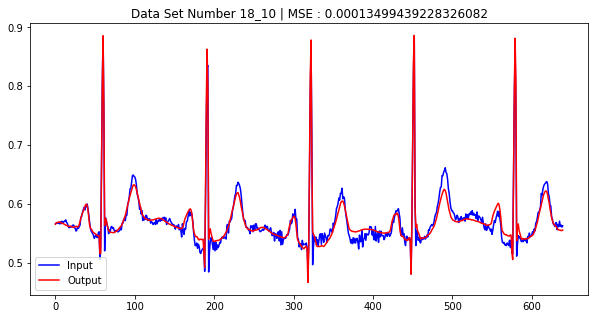

[-1.4047949  -0.41663852  1.0679538  -0.79248285 -0.9413881  -0.6612937
  1.9605262   2.1939902  -1.4228828   4.068237   -4.5191913   0.05997442
 -0.6961751   1.7119082  -3.1934752   0.8958087  -1.8281183  -3.5304368
  2.1604302  -3.5603163  -0.89774287  1.5540185   3.479364    0.92473567
  0.8991802   1.2334329  -0.794146    2.33494     4.5482855  -1.932107
  0.26933584 -3.5553846 ]


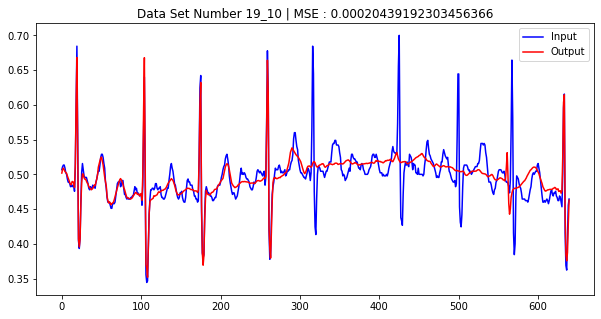

In [33]:
show_num = 20
show_idx = 0

for x in train_set:
    output, latent_arr = model(x)
    x_arr = x.numpy().reshape(batch_size, time_size)
    y_arr = output.numpy().reshape(batch_size, time_size)
    mse = np.mean(np.square(x_arr-y_arr))
    print(latent_arr.numpy()[10])
    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(111)
    ax.plot(np.arange(time_size), x_arr[10], label="Input", color="b")
    ax.plot(np.arange(time_size), y_arr[10], label="Output", color="r")
    ax.legend()
    ax.set_title("Data Set Number {}_{} | MSE : {}".format(show_idx, random_idx, mse))
    plt.show()
    
    show_idx += 1
    
    if show_idx == show_num:
        break

In [6]:
for x in train_set:
    output, latent_arr = model(x)
    break

In [7]:
sample_latent_arr = latent_arr.numpy()[10]
sample_latent_arr = sample_latent_arr.reshape(1,32)

sample_latent_tensor = tf.convert_to_tensor(sample_latent_arr, dtype=tf.float32)

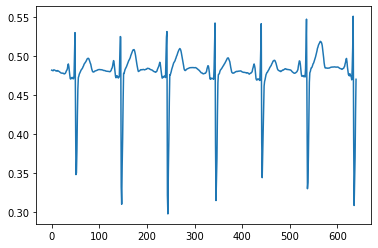

In [10]:
output_sampel = DL_model(sample_latent_tensor)
plt.plot(output_sampel.numpy().reshape(-1))

In [11]:
print(sample_latent_arr.shape, pca.components_.shape)

NameError: name 'pca' is not defined

In [13]:
np.save('/works/GitLab/jomjam/Python/AnomalyDetection/ECG/StreamLit/default', sample_latent_arr)